In [ ]:
import os
import shutil

# Define source and destination folders
image_src = '/workspace/data/final_split_balanced/augmentedtrain/images'
mask_src = '/workspace/data/final_split_balanced/augmentedtrain/masks'
output_image_dir = '/workspace/data/final_split_balanced/filtered_data/images'
output_mask_dir = '/workspace/data/final_split_balanced/filtered_data/masks'

# Create destination folders if they don't exist
os.makedirs(output_image_dir, exist_ok=True)
os.makedirs(output_mask_dir, exist_ok=True)

def copy_filtered_files(src_dir, dest_dir):
    for filename in os.listdir(src_dir):
        full_path = os.path.join(src_dir, filename)

        # Skip directories like .ipynb_checkpoints
        if not os.path.isfile(full_path):
            continue

        # Skip files ending with _flip before extension
        name, ext = os.path.splitext(filename)
        if not name.endswith('_flip'):
            shutil.copy(full_path, os.path.join(dest_dir, filename))

# Copy images and masks
copy_filtered_files(image_src, output_image_dir)
copy_filtered_files(mask_src, output_mask_dir)

print("Filtered files copied successfully.")


Filtered files copied successfully.


In [ ]:
import os
import shutil

# List of target directories to check
paths = [
    "/workspace/data/final_split_balanced/augmentedtrain/images",
    "/workspace/data/final_split_balanced/augmentedtrain/masks"
]

# Folder name to check for
target_folder = ".ipynb_checkpoints"

for path in paths:
    checkpoint_path = os.path.join(path, target_folder)
    if os.path.exists(checkpoint_path):
        print(f"Found and removing: {checkpoint_path}")
        shutil.rmtree(checkpoint_path)
    else:
        print(f"No checkpoint found in: {path}")


Found and removing: /workspace/data/final_split_balanced/augmentedtrain/images/.ipynb_checkpoints
No checkpoint found in: /workspace/data/final_split_balanced/augmentedtrain/masks


In [ ]:
!pip install opencv-python


In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import importlib.util
import cv2
import gc
from tensorflow.keras.callbacks import EarlyStopping

# === DICOMDataGen ===
class DICOMDataGen(tf.keras.utils.Sequence):
    def __init__(self, image_ids, img_path, mask_path, batch_size=4, image_size=512, shuffle=True):
        self.ids = image_ids
        self.img_path = img_path
        self.mask_path = mask_path
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __load__(self, item):
        image = cv2.imread(os.path.join(self.img_path, item), cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
        mask = cv2.imread(os.path.join(self.mask_path, item), cv2.IMREAD_GRAYSCALE).astype(np.float32)
        mask = (mask >= 255).astype(np.float32)

        image = cv2.resize(image, (self.image_size, self.image_size), interpolation=cv2.INTER_LINEAR)
        mask = cv2.resize(mask, (self.image_size, self.image_size), interpolation=cv2.INTER_NEAREST)

        return np.expand_dims(image, axis=-1), np.expand_dims(mask, axis=-1)

    def __getitem__(self, index):
        batch_ids = self.ids[index * self.batch_size : (index + 1) * self.batch_size]
        images, masks = zip(*(self.__load__(i) for i in batch_ids))
        return np.array(images), np.array(masks)

    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.ids)
        gc.collect()

    def __len__(self):
        return int(np.ceil(len(self.ids) / self.batch_size))


# === Metrics and Loss Functions ===
def dice_coef(y_true, y_pred):
    smooth = 1e-6
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1. - dice_coef(y_true, y_pred)

def iou_score(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    union = tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)


# === Compute Shape Prior ===
def compute_shape_prior_from_generator(generator):
    all_masks = []
    for i in range(len(generator)):
        _, masks = generator[i]
        all_masks.append(masks)
    all_masks = np.concatenate(all_masks, axis=0)
    prior = np.mean(all_masks, axis=0)  # shape: (H, W, 1)
    return prior


# === Custom Total Loss ===
def total_loss_fn(prior):
    prior_tensor = tf.convert_to_tensor(prior, dtype=tf.float32)
    def loss(y_true, y_pred):
        d_loss = dice_loss(y_true, y_pred)
        s_loss = tf.reduce_mean(tf.square(y_pred - prior_tensor))
        return d_loss + 0.1 * s_loss
    return loss


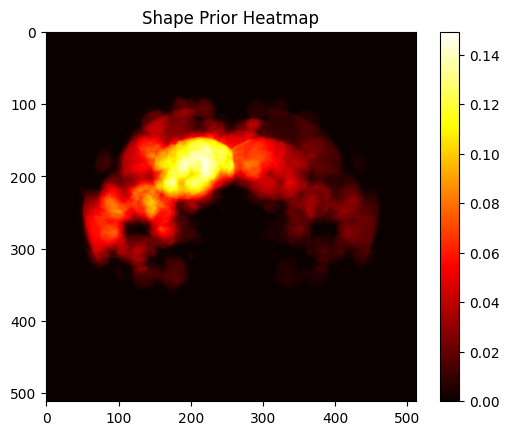

Epoch 1/50


2025-04-21 13:33:07.053209: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 77s 151ms/step - loss: 0.9892 - dice_coef: 0.0153 - iou_score: 0.0078 - val_loss: 0.9499 - val_dice_coef: 0.0500 - val_iou_score: 0.0259
Epoch 2/50
454/454 [==============================] - 69s 151ms/step - loss: 0.9616 - dice_coef: 0.0408 - iou_score: 0.0212 - val_loss: 1.0001 - val_dice_coef: 2.3164e-10 - val_iou_score: 2.3164e-10
Epoch 3/50
454/454 [==============================] - 68s 150ms/step - loss: 0.9333 - dice_coef: 0.0681 - iou_score: 0.0366 - val_loss: 0.8753 - val_dice_coef: 0.1231 - val_iou_score: 0.0671
Epoch 4/50
454/454 [==============================] - 68s 150ms/step - loss: 0.8902 - dice_coef: 0.1109 - iou_score: 0.0616 - val_loss: 0.9146 - val_dice_coef: 0.0872 - val_iou_score: 0.0467
Epoch 5/50
454/454 [==============================] - 67s 148ms/step - loss: 0.8146 - dice_coef: 0.1871 - iou_score: 0.1107 - val_loss: 0.8462 - val_dice_coef: 0.1573 - val_iou_score: 0.0903
Epoch 6/50
454/454 [============================

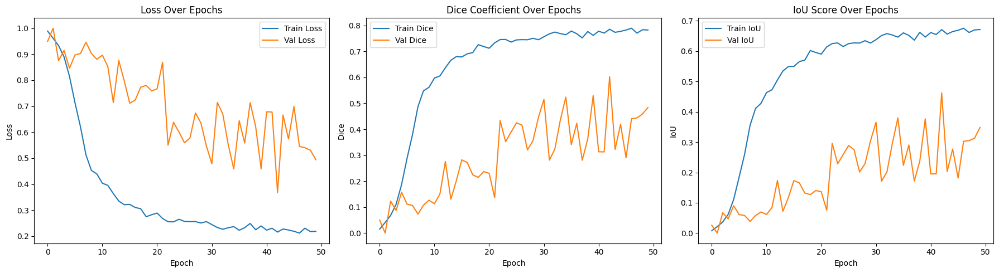

22707

In [ ]:

# === Load UNet++ Dynamically ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus


# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted(os.listdir(train_img_path))
valid_image_ids = sorted(os.listdir(valid_img_path))

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()


# === Build Model ===
input_shape = (img_size, img_size, 1)
model = UNetPlusPlus(input_shape=input_shape).BuildNetwork()
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)

model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Training ===
callbacks = [
    EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save Model ===
model_path = "/workspace/shape_prior_models/shapeprior_no_weigts_start_from_scratch.h5"
model.save(model_path)
print(f"Final model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


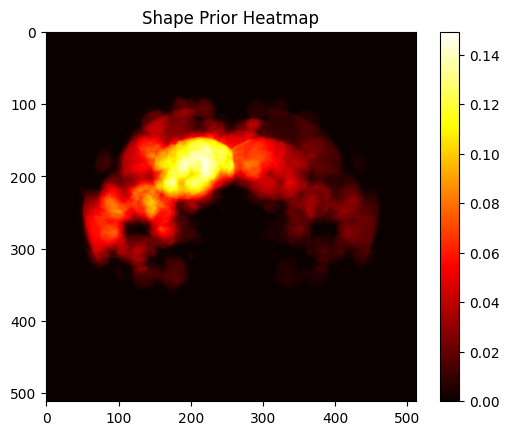

Epoch 1/50


2025-04-15 19:02:23.561533: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 83s 152ms/step - loss: 0.9667 - dice_coef: 0.0384 - iou_score: 0.0198 - val_loss: 0.9228 - val_dice_coef: 0.0786 - val_iou_score: 0.0417
Epoch 2/50
454/454 [==============================] - 68s 150ms/step - loss: 0.9711 - dice_coef: 0.0306 - iou_score: 0.0160 - val_loss: 1.0001 - val_dice_coef: 2.3163e-10 - val_iou_score: 2.3163e-10
Epoch 3/50
454/454 [==============================] - 69s 151ms/step - loss: 0.9603 - dice_coef: 0.0417 - iou_score: 0.0221 - val_loss: 0.9984 - val_dice_coef: 0.0018 - val_iou_score: 9.1360e-04
Epoch 4/50
454/454 [==============================] - 67s 148ms/step - loss: 0.8983 - dice_coef: 0.1048 - iou_score: 0.0580 - val_loss: 0.9429 - val_dice_coef: 0.0667 - val_iou_score: 0.0357
Epoch 5/50
454/454 [==============================] - 67s 147ms/step - loss: 0.8603 - dice_coef: 0.1429 - iou_score: 0.0805 - val_loss: 0.9470 - val_dice_coef: 0.0588 - val_iou_score: 0.0321
Epoch 6/50
454/454 [========================

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Final model saved to: /workspace/final_unetpp_with_shapeprior.h5


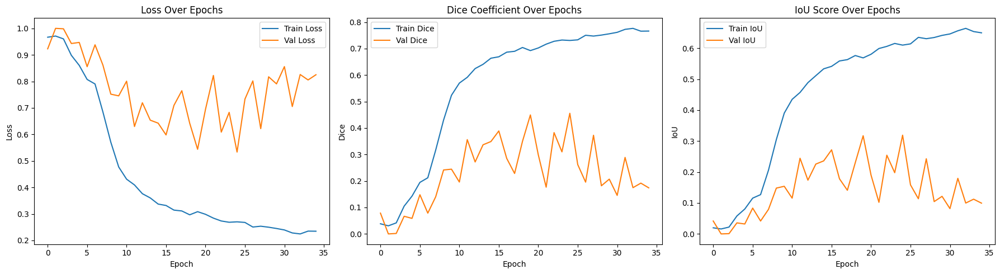

10685

In [ ]:

# === Load UNet++ Dynamically ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus


# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted(os.listdir(train_img_path))
valid_image_ids = sorted(os.listdir(valid_img_path))

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()


# === Build Model ===
input_shape = (img_size, img_size, 1)
model = UNetPlusPlus(input_shape=input_shape).BuildNetwork()
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)

model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Training ===
callbacks = [
    EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save Model ===
model_path = "/workspace/final_unetpp_with_shapeprior.h5"
model.save(model_path)
print(f"Final model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


1/1 [==============================] - 0s 28ms/step


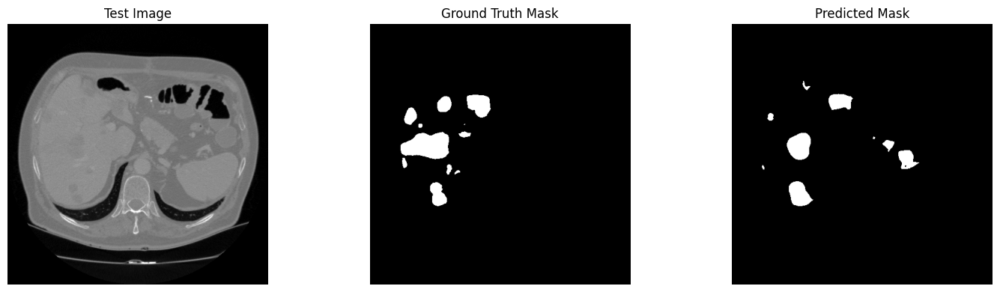

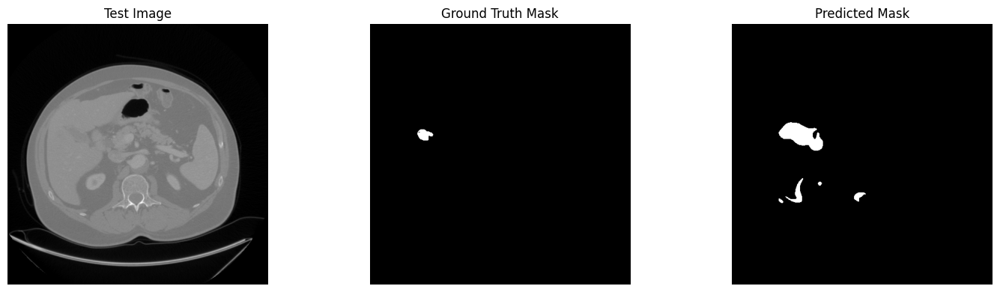

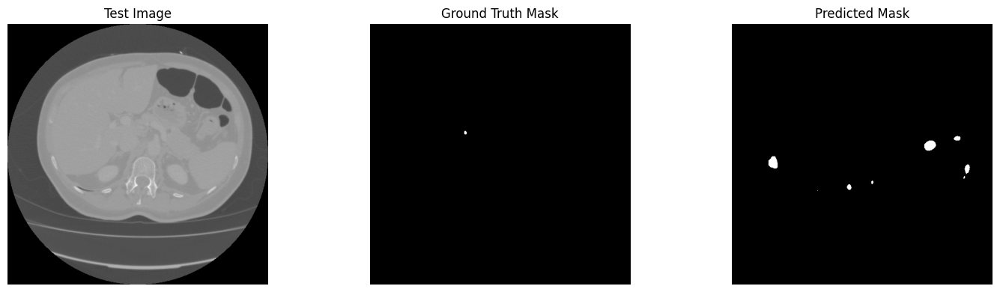

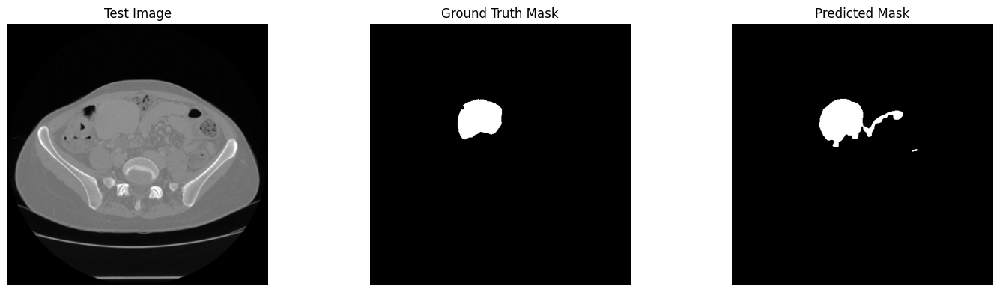

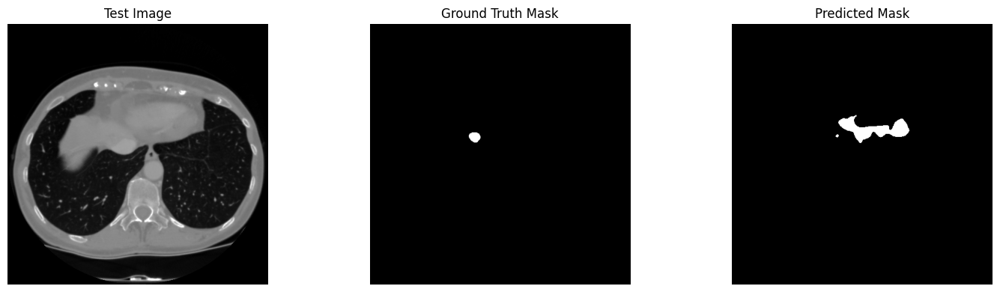

...

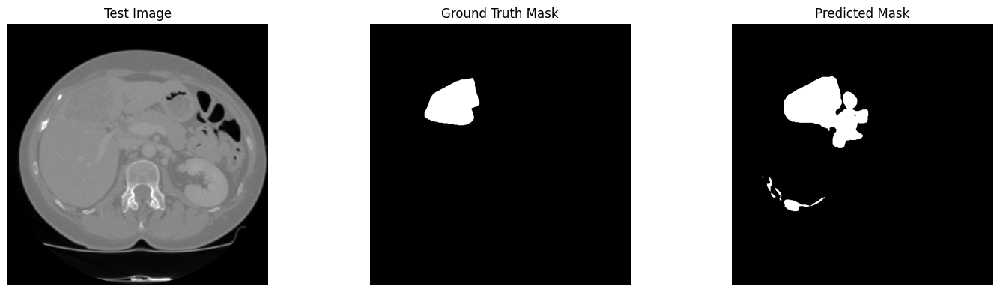

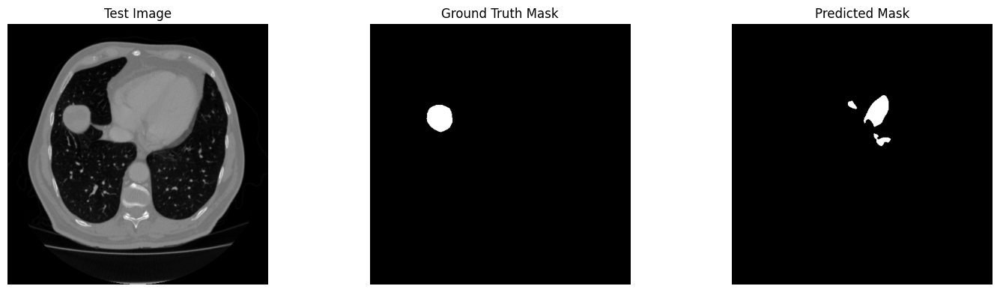

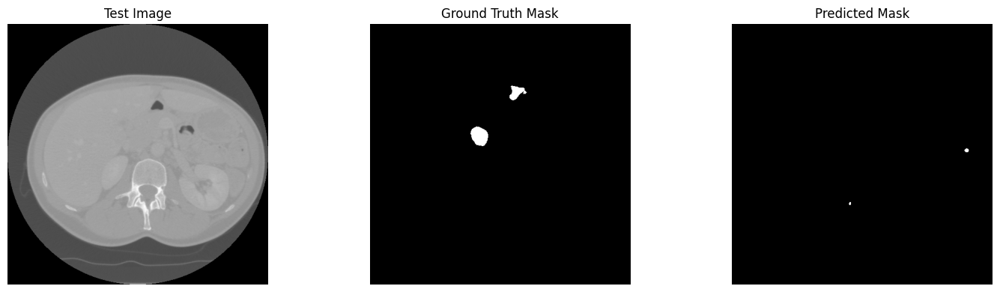

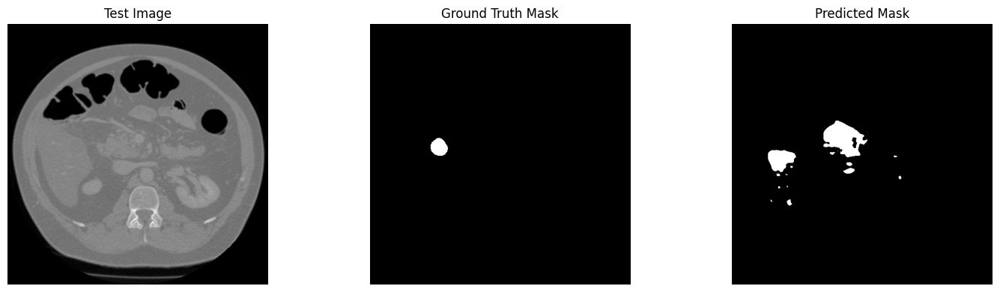

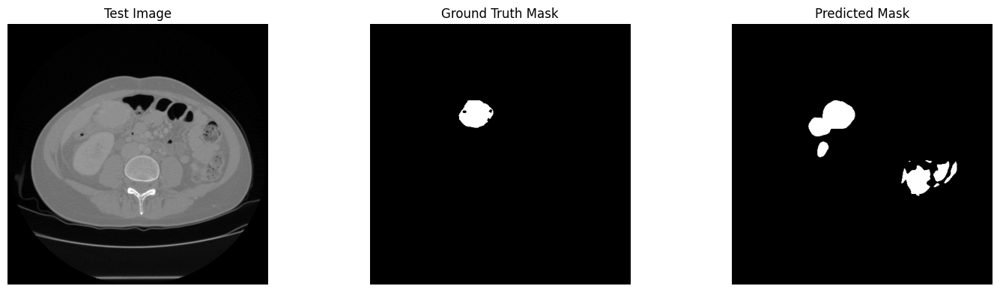

In [ ]:
#Test the model
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# === Paths ===
test_img_path = "/workspace/data/final_split_balanced/test/images"      # Update this
test_mask_path = "/workspace/data/final_split_balanced/test/masks"      # Update this
model_path = "/workspace/final_unetpp_with_shapeprior.h5"

# === Parameters ===
img_size = 512
batch_size = 2

# === Get all test image IDs ===
test_image_ids = [os.path.basename(f) for f in glob.glob(os.path.join(test_img_path, "*.png"))]

# === Create the test generator ===
test_gen = DICOMDataGen(
    test_image_ids,
    test_img_path,
    test_mask_path,
    batch_size=batch_size,
    image_size=img_size,  # ✅ correct key
    shuffle=False
)

# === Load the trained SE-enhanced UNet++ model ===
model = load_model(model_path, compile=False)

# === Run predictions on all test images ===
all_images = []
all_masks = []
all_preds = []

for batch_images, batch_masks in test_gen:
    preds = model.predict(batch_images)
    preds_bin = (preds > 0.5).astype(np.float32)

    all_images.extend(batch_images)
    all_masks.extend(batch_masks)
    all_preds.extend(preds_bin)

# === Convert to NumPy arrays for easy handling ===
all_images = np.array(all_images)
all_masks = np.array(all_masks)
all_preds = np.array(all_preds)

# === Visualize results ===
for i in range(len(all_images)):
    plt.figure(figsize=(15, 4))

    # Original input image
    plt.subplot(1, 3, 1)
    plt.imshow(all_images[i, :, :, 0], cmap='gray')
    plt.title("Test Image")
    plt.axis('off')


    # Ground Truth Mask
    plt.subplot(1, 3, 2)
    plt.imshow(all_masks[i, :, :, 0], cmap='gray')
    plt.title("Ground Truth Mask")
    plt.axis('off')


    # Predicted Mask
    plt.subplot(1, 3, 3)
    plt.imshow(all_preds[i, :, :, 0], cmap='gray')
    plt.title("Predicted Mask")
    plt.axis('off')


    plt.tight_layout()
    plt.show()


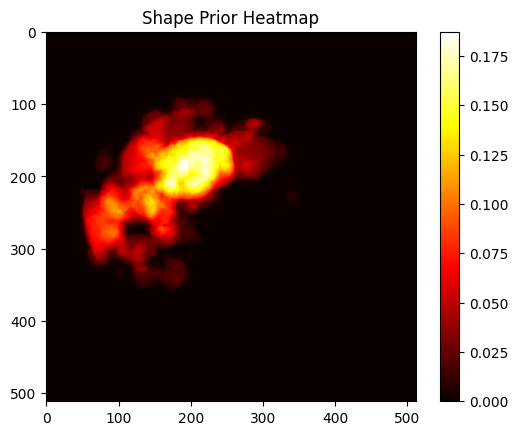

In [ ]:
import os
import importlib.util
import matplotlib.pyplot as plt

# === Load UNet++ Utilities (if shape prior logic is defined there) ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)


# === Data paths ===
train_img_path = "/workspace/data/final_split_balanced/filtered_data/images"
train_mask_path = "/workspace/data/final_split_balanced/filtered_data/masks"
train_image_ids = sorted(os.listdir(train_img_path))

# === Parameters ===
img_size = 512
batch_size = 4

# === Create Data Generator ===
train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)

# === Compute Shape Prior ===
shape_prior = compute_shape_prior_from_generator(train_gen)

# === Visualize Shape Prior ===
plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()


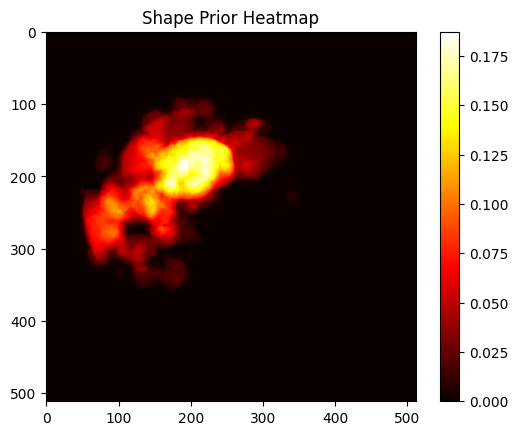

Epoch 1/50


2025-04-21 02:49:04.655612: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


341/341 [==============================] - 60s 151ms/step - loss: 0.9895 - dice_coef: 0.0149 - iou_score: 0.0075 - val_loss: 0.9574 - val_dice_coef: 0.0472 - val_iou_score: 0.0244
Epoch 2/50
341/341 [==============================] - 52s 151ms/step - loss: 0.9493 - dice_coef: 0.0533 - iou_score: 0.0280 - val_loss: 1.0001 - val_dice_coef: 3.3200e-09 - val_iou_score: 1.7757e-09
Epoch 3/50
341/341 [==============================] - 51s 150ms/step - loss: 0.9052 - dice_coef: 0.0977 - iou_score: 0.0536 - val_loss: 0.9181 - val_dice_coef: 0.0876 - val_iou_score: 0.0500
Epoch 4/50
341/341 [==============================] - 50s 147ms/step - loss: 0.8010 - dice_coef: 0.2011 - iou_score: 0.1178 - val_loss: 0.9080 - val_dice_coef: 0.1020 - val_iou_score: 0.0553
Epoch 5/50
341/341 [==============================] - 51s 149ms/step - loss: 0.7661 - dice_coef: 0.2356 - iou_score: 0.1446 - val_loss: 0.8571 - val_dice_coef: 0.1487 - val_iou_score: 0.0839
Epoch 6/50
341/341 [============================

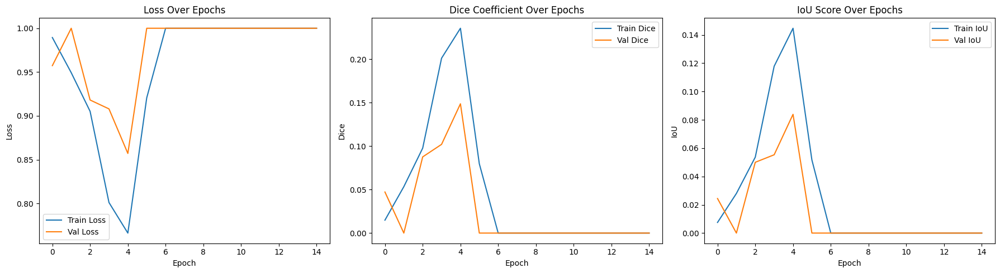

22404

In [ ]:

# === Load UNet++ Dynamically ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus


# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/filtered_data/images"
train_mask_path = "/workspace/data/final_split_balanced/filtered_data/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted(os.listdir(train_img_path))
valid_image_ids = sorted(os.listdir(valid_img_path))

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()


# === Build Model ===
input_shape = (img_size, img_size, 1)
model = UNetPlusPlus(input_shape=input_shape).BuildNetwork()
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)

model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Training ===
callbacks = [
    EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save Model ===
model_path = "/workspace/shapeprior_models_noweights.h5"
model.save(model_path)
print(f"Final model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


In [ ]:
import os

# === Set your directories ===
image_dir = "/workspace/data/final_split_balanced/augmentedtrain/images"
mask_dir = "/workspace/data/final_split_balanced/augmentedtrain/masks"

def clean_non_png_files(folder_path, folder_label):
    print(f"\n Checking: {folder_label}")
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        if os.path.isfile(file_path) and not filename.lower().endswith('.png'):
            print(f" Found non-PNG file: {file_path}")
            os.remove(file_path)
            print(f" Deleted: {file_path}")

import shutil

def remove_ipynb_checkpoints(folder_path):
    for root, dirs, _ in os.walk(folder_path):
        for d in dirs:
            if d == ".ipynb_checkpoints":
                path_to_delete = os.path.join(root, d)
                print(f"🗑️ Removing directory: {path_to_delete}")
                shutil.rmtree(path_to_delete)

# Run this for both folders
remove_ipynb_checkpoints(image_dir)
remove_ipynb_checkpoints(mask_dir)

# === Run cleanup for both folders ===
clean_non_png_files(image_dir, "Images Folder")
clean_non_png_files(mask_dir, "Masks Folder")


🗑️ Removing directory: /workspace/data/final_split_balanced/augmentedtrain/images/.ipynb_checkpoints

 Checking: Images Folder

 Checking: Masks Folder


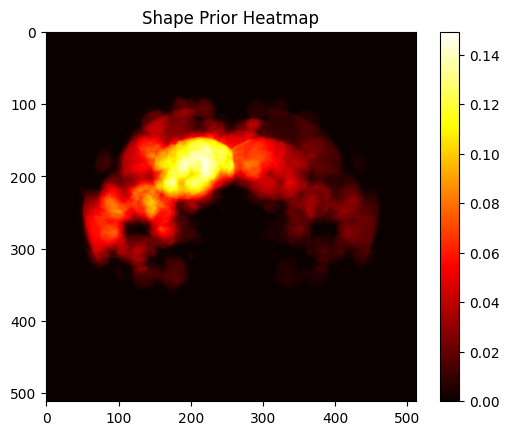

 Pretrained weights loaded.
 Unfrozen layers: conv04, concat04, upsample04
Epoch 1/50


2025-04-21 03:37:35.977112: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 37s 77ms/step - loss: 0.9637 - dice_coef: 0.0384 - iou_score: 0.0197 - val_loss: 0.9943 - val_dice_coef: 0.0058 - val_iou_score: 0.0029
Epoch 2/50
454/454 [==============================] - 37s 82ms/step - loss: 0.9418 - dice_coef: 0.0604 - iou_score: 0.0315 - val_loss: 0.9950 - val_dice_coef: 0.0048 - val_iou_score: 0.0025
Epoch 3/50
454/454 [==============================] - 35s 78ms/step - loss: 0.9371 - dice_coef: 0.0663 - iou_score: 0.0347 - val_loss: 0.9959 - val_dice_coef: 0.0041 - val_iou_score: 0.0020
Epoch 4/50
454/454 [==============================] - 35s 76ms/step - loss: 0.9343 - dice_coef: 0.0690 - iou_score: 0.0362 - val_loss: 0.9957 - val_dice_coef: 0.0043 - val_iou_score: 0.0022
Epoch 5/50
454/454 [==============================] - 36s 79ms/step - loss: 0.9322 - dice_coef: 0.0711 - iou_score: 0.0374 - val_loss: 0.9953 - val_dice_coef: 0.0057 - val_iou_score: 0.0029
Epoch 6/50
454/454 [==============================] - 38s 83m

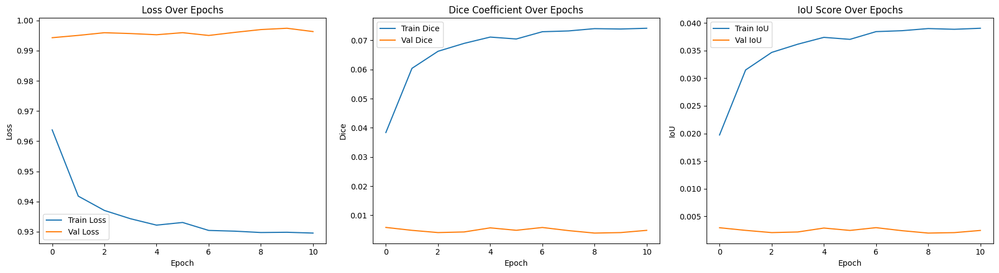

22308

In [ ]:
import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted(os.listdir(train_img_path))
valid_image_ids = sorted(os.listdir(valid_img_path))

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# === Freeze all layers ===
for layer in model.layers:
    layer.trainable = False

# === Unfreeze last decoder layer ===
for layer in model.layers:
    if any(name in layer.name for name in ['conv04', 'concat04', 'upsample04']):
        layer.trainable = True
print(" Unfrozen layers: conv04, concat04, upsample04")

# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase1_lastlayer.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")


# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


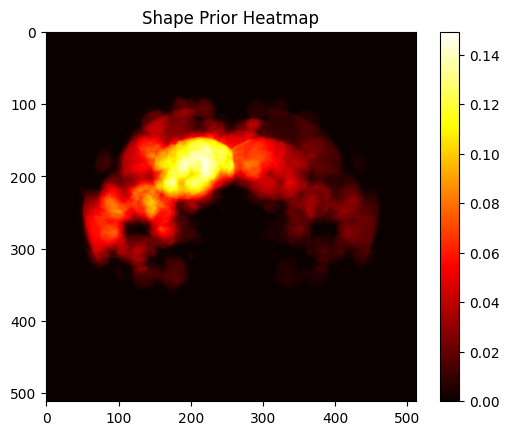

 Pretrained weights loaded.
Frozen: conv00
 All other layers set to trainable
Epoch 1/50


2025-04-21 04:00:11.296309: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 70s 138ms/step - loss: 0.9247 - dice_coef: 0.0792 - iou_score: 0.0422 - val_loss: 0.9953 - val_dice_coef: 0.0047 - val_iou_score: 0.0024
Epoch 2/50
454/454 [==============================] - 65s 142ms/step - loss: 0.8671 - dice_coef: 0.1350 - iou_score: 0.0751 - val_loss: 0.9973 - val_dice_coef: 0.0027 - val_iou_score: 0.0014
Epoch 3/50
454/454 [==============================] - 63s 138ms/step - loss: 0.8467 - dice_coef: 0.1554 - iou_score: 0.0881 - val_loss: 0.9969 - val_dice_coef: 0.0031 - val_iou_score: 0.0016
Epoch 4/50
454/454 [==============================] - 63s 138ms/step - loss: 0.8388 - dice_coef: 0.1634 - iou_score: 0.0932 - val_loss: 0.9970 - val_dice_coef: 0.0029 - val_iou_score: 0.0015
Epoch 5/50
454/454 [==============================] - 62s 137ms/step - loss: 0.8273 - dice_coef: 0.1747 - iou_score: 0.1010 - val_loss: 0.9981 - val_dice_coef: 0.0019 - val_iou_score: 9.5803e-04
Epoch 6/50
454/454 [==============================] 

KeyboardInterrupt: 

In [ ]:
#freeze only first layer
import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted(os.listdir(train_img_path))
valid_image_ids = sorted(os.listdir(valid_img_path))


In [ ]:
#Forward freezing assumes encoder features are general and kept stable early

#9 phases

 Pretrained weights loaded.
Frozen: conv00
 All other layers set to trainable
Epoch 1/50


2025-04-21 04:10:04.073699: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 71s 139ms/step - loss: 0.8428 - dice_coef: 0.1593 - iou_score: 0.0924 - val_loss: 0.9907 - val_dice_coef: 0.0089 - val_iou_score: 0.0046
Epoch 2/50
454/454 [==============================] - 63s 138ms/step - loss: 0.7787 - dice_coef: 0.2227 - iou_score: 0.1368 - val_loss: 0.9819 - val_dice_coef: 0.0176 - val_iou_score: 0.0093
Epoch 3/50
454/454 [==============================] - 63s 139ms/step - loss: 0.7479 - dice_coef: 0.2530 - iou_score: 0.1618 - val_loss: 0.9915 - val_dice_coef: 0.0089 - val_iou_score: 0.0045
Epoch 4/50
454/454 [==============================] - 63s 139ms/step - loss: 0.7025 - dice_coef: 0.2983 - iou_score: 0.1963 - val_loss: 0.9812 - val_dice_coef: 0.0194 - val_iou_score: 0.0103
Epoch 5/50
454/454 [==============================] - 63s 139ms/step - loss: 0.6766 - dice_coef: 0.3242 - iou_score: 0.2169 - val_loss: 0.9061 - val_dice_coef: 0.1050 - val_iou_score: 0.0568
Epoch 6/50
454/454 [==============================] - 63

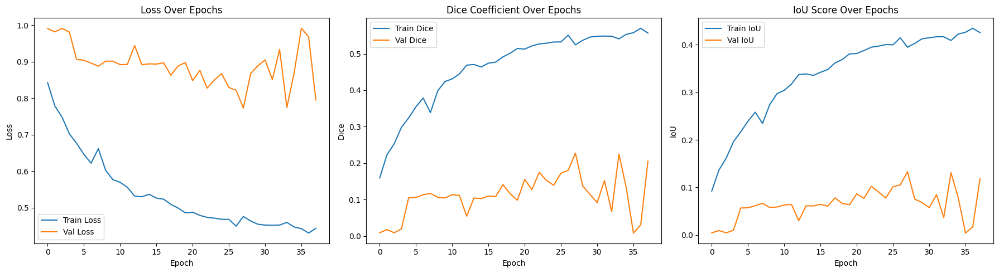

21333

In [ ]:

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)



# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# === Freeze only the first encoder layer ===
for layer in model.layers:
    if 'conv00' in layer.name:
        layer.trainable = False
    else:
        layer.trainable = True

print("Frozen: conv00")
print(" All other layers set to trainable")

# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase2_freeze_firstlayer.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")


# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
 Frozen layers: conv00, conv10
 All other layers set to trainable


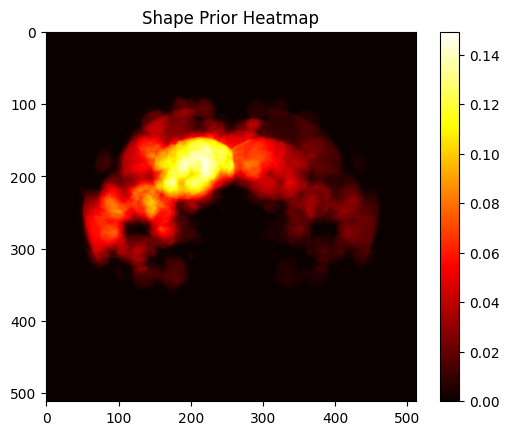

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 06:08:25.931612: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 68s 134ms/step - loss: 0.8513 - dice_coef: 0.1510 - iou_score: 0.0866 - val_loss: 0.9989 - val_dice_coef: 0.0011 - val_iou_score: 5.4148e-04
Epoch 2/50
454/454 [==============================] - 71s 156ms/step - loss: 0.8058 - dice_coef: 0.1958 - iou_score: 0.1175 - val_loss: 0.9988 - val_dice_coef: 0.0012 - val_iou_score: 5.8979e-04
Epoch 3/50
454/454 [==============================] - 68s 150ms/step - loss: 0.7647 - dice_coef: 0.2362 - iou_score: 0.1476 - val_loss: 0.9989 - val_dice_coef: 0.0011 - val_iou_score: 5.3815e-04
Epoch 4/50
454/454 [==============================] - 71s 157ms/step - loss: 0.7334 - dice_coef: 0.2674 - iou_score: 0.1728 - val_loss: 0.9978 - val_dice_coef: 0.0022 - val_iou_score: 0.0011
Epoch 5/50
454/454 [==============================] - 72s 159ms/step - loss: 0.7222 - dice_coef: 0.2786 - iou_score: 0.1832 - val_loss: 1.0001 - val_dice_coef: 1.1325e-07 - val_iou_score: 5.6743e-08
Epoch 6/50
454/454 [================

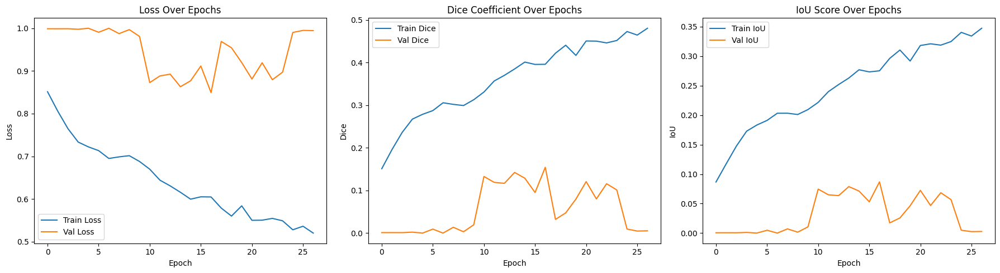

22015

In [ ]:
import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# === Freeze only first two encoder layers ===
for layer in model.layers:
    if any(name in layer.name for name in ['conv00', 'conv10']):
        layer.trainable = False
    else:
        layer.trainable = True

print(" Frozen layers: conv00, conv10")
print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_freeze_first_two_layers.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
 Frozen layers: conv00, conv10, conv20
 All other layers set to trainable


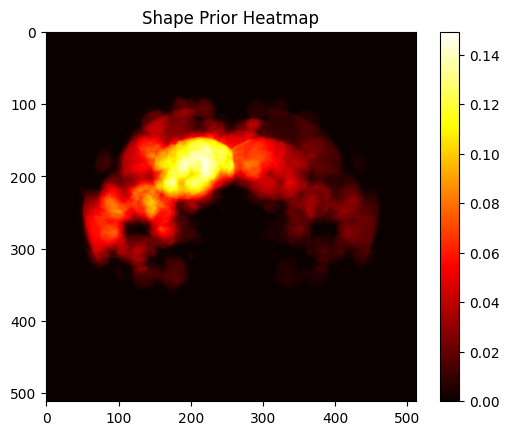

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 07:56:00.769168: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 68s 132ms/step - loss: 0.8566 - dice_coef: 0.1457 - iou_score: 0.0830 - val_loss: 0.9947 - val_dice_coef: 0.0051 - val_iou_score: 0.0026
Epoch 2/50
454/454 [==============================] - 60s 131ms/step - loss: 0.8007 - dice_coef: 0.2006 - iou_score: 0.1215 - val_loss: 0.9975 - val_dice_coef: 0.0025 - val_iou_score: 0.0013
Epoch 3/50
454/454 [==============================] - 60s 133ms/step - loss: 0.7743 - dice_coef: 0.2267 - iou_score: 0.1423 - val_loss: 0.9996 - val_dice_coef: 4.6399e-04 - val_iou_score: 2.3280e-04
Epoch 4/50
454/454 [==============================] - 61s 133ms/step - loss: 0.7591 - dice_coef: 0.2418 - iou_score: 0.1530 - val_loss: 0.9989 - val_dice_coef: 0.0013 - val_iou_score: 6.5147e-04
Epoch 5/50
454/454 [==============================] - 62s 136ms/step - loss: 0.7607 - dice_coef: 0.2401 - iou_score: 0.1531 - val_loss: 0.9973 - val_dice_coef: 0.0030 - val_iou_score: 0.0015
Epoch 6/50
454/454 [========================

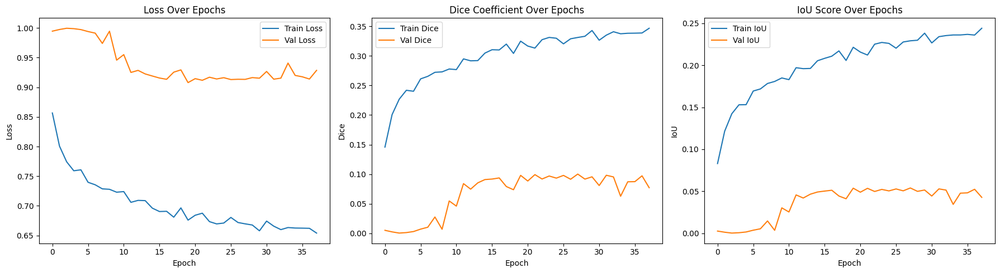

22646

In [ ]:
#✅ Phase 3: Freeze conv00, conv10, conv20


import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# === Freeze encoder: conv00, conv10, conv20 ===
for layer in model.layers:
    if any(name in layer.name for name in ['conv00', 'conv10', 'conv20']):
        layer.trainable = False
    else:
        layer.trainable = True

print(" Frozen layers: conv00, conv10, conv20")


print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_freeze_first_three_layers.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
🧊 Frozen layers: conv00 to conv30
 All other layers set to trainable


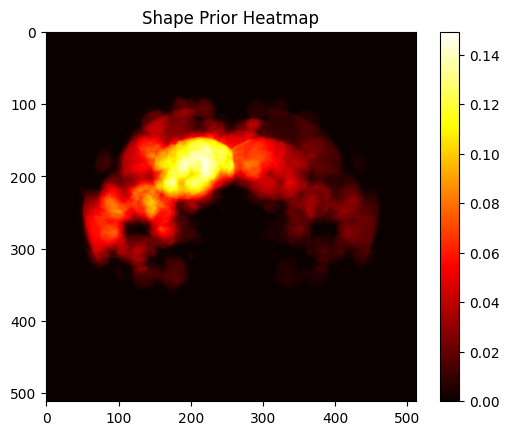

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 08:39:49.682359: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 65s 129ms/step - loss: 0.8695 - dice_coef: 0.1329 - iou_score: 0.0746 - val_loss: 0.9983 - val_dice_coef: 0.0016 - val_iou_score: 8.3279e-04
Epoch 2/50
454/454 [==============================] - 59s 129ms/step - loss: 0.8321 - dice_coef: 0.1697 - iou_score: 0.0991 - val_loss: 0.9977 - val_dice_coef: 0.0022 - val_iou_score: 0.0011
Epoch 3/50
454/454 [==============================] - 59s 131ms/step - loss: 0.8053 - dice_coef: 0.1961 - iou_score: 0.1186 - val_loss: 0.9992 - val_dice_coef: 8.9070e-04 - val_iou_score: 4.4832e-04
Epoch 4/50
454/454 [==============================] - 59s 130ms/step - loss: 0.7801 - dice_coef: 0.2209 - iou_score: 0.1372 - val_loss: 0.9967 - val_dice_coef: 0.0040 - val_iou_score: 0.0020
Epoch 5/50
454/454 [==============================] - 59s 131ms/step - loss: 0.7740 - dice_coef: 0.2270 - iou_score: 0.1423 - val_loss: 0.9971 - val_dice_coef: 0.0038 - val_iou_score: 0.0019
Epoch 6/50
454/454 [========================

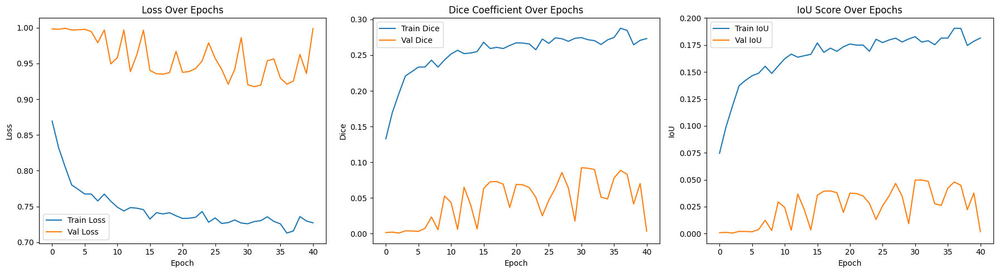

22914

In [ ]:
#Phase 4: Add conv30


import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# === Freeze encoder: conv00 to conv30 ===
for layer in model.layers:
    if any(name in layer.name for name in ['conv00', 'conv10', 'conv20', 'conv30']):
        layer.trainable = False
    else:
        layer.trainable = True

print("🧊 Frozen layers: conv00 to conv30")



print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_freeze_first_four_layers.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
🧊 Frozen layers: conv00 to conv40
 All other layers set to trainable


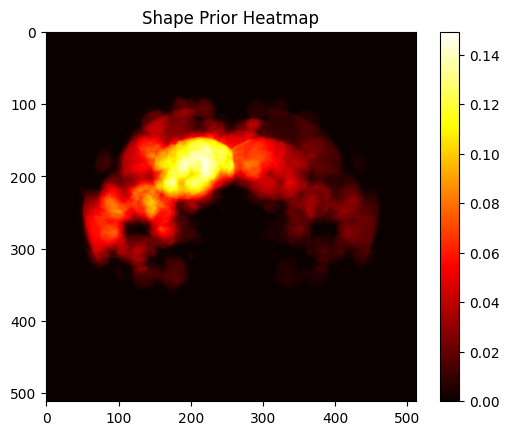

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 09:30:47.798005: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 65s 129ms/step - loss: 0.8963 - dice_coef: 0.1067 - iou_score: 0.0582 - val_loss: 0.9990 - val_dice_coef: 0.0010 - val_iou_score: 5.2280e-04
Epoch 2/50
454/454 [==============================] - 58s 129ms/step - loss: 0.8594 - dice_coef: 0.1428 - iou_score: 0.0804 - val_loss: 0.9990 - val_dice_coef: 0.0010 - val_iou_score: 5.2430e-04
Epoch 3/50
454/454 [==============================] - 59s 129ms/step - loss: 0.8431 - dice_coef: 0.1590 - iou_score: 0.0906 - val_loss: 0.9978 - val_dice_coef: 0.0023 - val_iou_score: 0.0012
Epoch 4/50
454/454 [==============================] - 59s 130ms/step - loss: 0.8399 - dice_coef: 0.1623 - iou_score: 0.0936 - val_loss: 1.0000 - val_dice_coef: 9.3789e-05 - val_iou_score: 4.6928e-05
Epoch 5/50
454/454 [==============================] - 59s 131ms/step - loss: 0.8350 - dice_coef: 0.1671 - iou_score: 0.0964 - val_loss: 0.9967 - val_dice_coef: 0.0036 - val_iou_score: 0.0018
Epoch 6/50
454/454 [====================

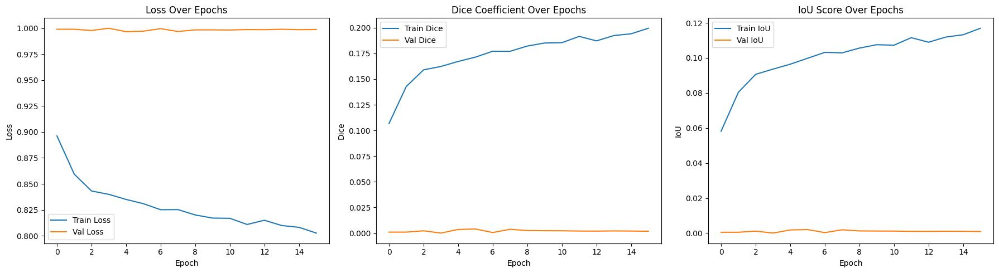

22758

In [ ]:
## === Freeze full encoder: conv00 to conv40 ==


import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# === Freeze full encoder: conv00 to conv40 ===
for layer in model.layers:
    if any(name in layer.name for name in ['conv00', 'conv10', 'conv20', 'conv30', 'conv40']):
        layer.trainable = False
    else:
        layer.trainable = True

print("🧊 Frozen layers: conv00 to conv40")




print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_freeze_first_five_layers_orallencoder.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
🧊 Frozen: conv00, conv10, conv20, conv30, conv40, conv01, conv11, conv21, conv31
 All other layers set to trainable


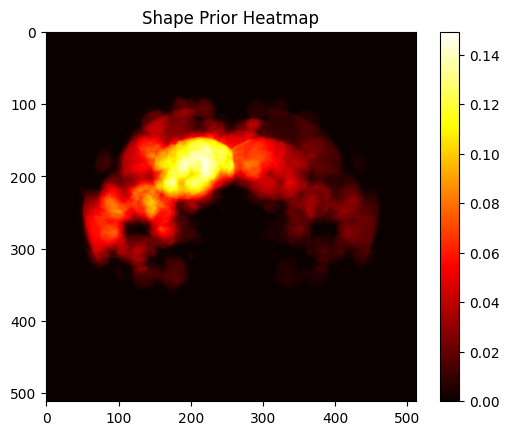

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 09:52:10.629742: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 61s 123ms/step - loss: 0.9149 - dice_coef: 0.0889 - iou_score: 0.0479 - val_loss: 0.9979 - val_dice_coef: 0.0021 - val_iou_score: 0.0011
Epoch 2/50
454/454 [==============================] - 56s 123ms/step - loss: 0.8743 - dice_coef: 0.1280 - iou_score: 0.0709 - val_loss: 0.9979 - val_dice_coef: 0.0023 - val_iou_score: 0.0012
Epoch 3/50
454/454 [==============================] - 56s 123ms/step - loss: 0.8628 - dice_coef: 0.1398 - iou_score: 0.0782 - val_loss: 0.9976 - val_dice_coef: 0.0030 - val_iou_score: 0.0015
Epoch 4/50
454/454 [==============================] - 56s 123ms/step - loss: 0.8551 - dice_coef: 0.1474 - iou_score: 0.0833 - val_loss: 0.9979 - val_dice_coef: 0.0027 - val_iou_score: 0.0014
Epoch 5/50
454/454 [==============================] - 56s 123ms/step - loss: 0.8487 - dice_coef: 0.1538 - iou_score: 0.0869 - val_loss: 0.9976 - val_dice_coef: 0.0027 - val_iou_score: 0.0014
Epoch 6/50
454/454 [==============================] - 56

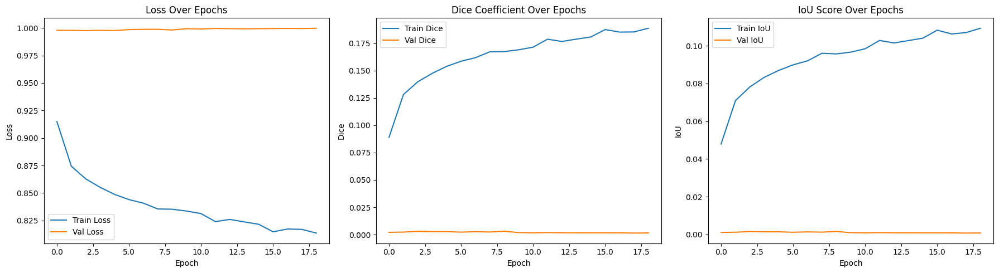

22502

In [ ]:
#Phase 6: Add shallow nested decoders conv01, conv11, conv21, conv31

import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# === Freeze encoder + shallow nested decoder ===
freeze_list = ['conv00', 'conv10', 'conv20', 'conv30', 'conv40',
               'conv01', 'conv11', 'conv21', 'conv31']

for layer in model.layers:
    if any(name in layer.name for name in freeze_list):
        layer.trainable = False
    else:
        layer.trainable = True

print("🧊 Frozen:", ', '.join(freeze_list))




print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_shallow_nested_decoder.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
 Frozen: conv00, conv10, conv20, conv30, conv40, conv01, conv11, conv21, conv31, conv02, conv12, conv22
 All other layers set to trainable


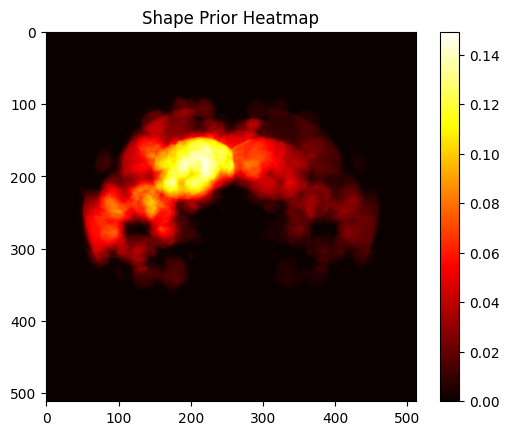

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 10:36:13.367995: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 57s 116ms/step - loss: 0.9238 - dice_coef: 0.0797 - iou_score: 0.0425 - val_loss: 0.9991 - val_dice_coef: 9.0250e-04 - val_iou_score: 4.5433e-04
Epoch 2/50
454/454 [==============================] - 52s 115ms/step - loss: 0.8792 - dice_coef: 0.1234 - iou_score: 0.0680 - val_loss: 0.9985 - val_dice_coef: 0.0015 - val_iou_score: 7.4076e-04
Epoch 3/50
454/454 [==============================] - 52s 116ms/step - loss: 0.8680 - dice_coef: 0.1343 - iou_score: 0.0749 - val_loss: 0.9964 - val_dice_coef: 0.0036 - val_iou_score: 0.0018
Epoch 4/50
454/454 [==============================] - 53s 116ms/step - loss: 0.8588 - dice_coef: 0.1435 - iou_score: 0.0807 - val_loss: 0.9985 - val_dice_coef: 0.0015 - val_iou_score: 7.8011e-04
Epoch 5/50
454/454 [==============================] - 54s 118ms/step - loss: 0.8565 - dice_coef: 0.1460 - iou_score: 0.0820 - val_loss: 0.9976 - val_dice_coef: 0.0024 - val_iou_score: 0.0012
Epoch 6/50
454/454 [====================

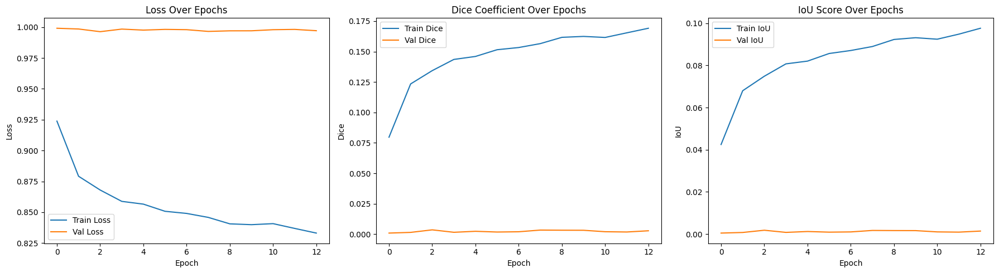

22151

In [ ]:
# ===phase7: Freeze encoder + more nested decoders ===

import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# === Freeze encoder + more nested decoders ===
freeze_list = ['conv00', 'conv10', 'conv20', 'conv30', 'conv40',
               'conv01', 'conv11', 'conv21', 'conv31',
               'conv02', 'conv12', 'conv22']

for layer in model.layers:
    if any(name in layer.name for name in freeze_list):
        layer.trainable = False
    else:
        layer.trainable = True

print(" Frozen:", ', '.join(freeze_list))



print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_more_nested_decoder.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
 Frozen: conv00, conv10, conv20, conv30, conv40, conv01, conv11, conv21, conv31, conv02, conv12, conv22, conv03, conv13
 All other layers set to trainable


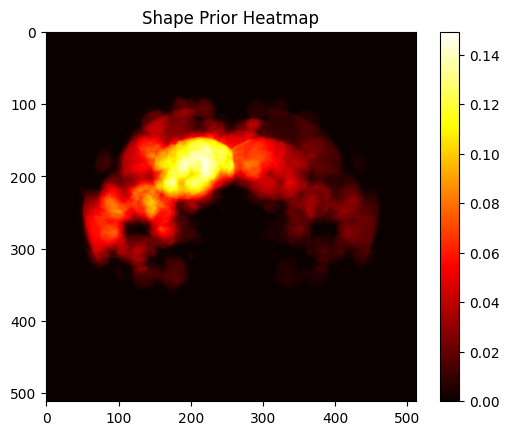

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 10:50:03.252172: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 55s 112ms/step - loss: 0.9333 - dice_coef: 0.0699 - iou_score: 0.0371 - val_loss: 0.9964 - val_dice_coef: 0.0038 - val_iou_score: 0.0019
Epoch 2/50
454/454 [==============================] - 50s 110ms/step - loss: 0.8785 - dice_coef: 0.1240 - iou_score: 0.0686 - val_loss: 0.9964 - val_dice_coef: 0.0037 - val_iou_score: 0.0019
Epoch 3/50
454/454 [==============================] - 50s 110ms/step - loss: 0.8644 - dice_coef: 0.1380 - iou_score: 0.0771 - val_loss: 0.9931 - val_dice_coef: 0.0068 - val_iou_score: 0.0035
Epoch 4/50
454/454 [==============================] - 50s 111ms/step - loss: 0.8591 - dice_coef: 0.1434 - iou_score: 0.0805 - val_loss: 0.9950 - val_dice_coef: 0.0049 - val_iou_score: 0.0025
Epoch 5/50
454/454 [==============================] - 50s 111ms/step - loss: 0.8531 - dice_coef: 0.1493 - iou_score: 0.0844 - val_loss: 0.9915 - val_dice_coef: 0.0082 - val_iou_score: 0.0042
Epoch 6/50
454/454 [==============================] - 50

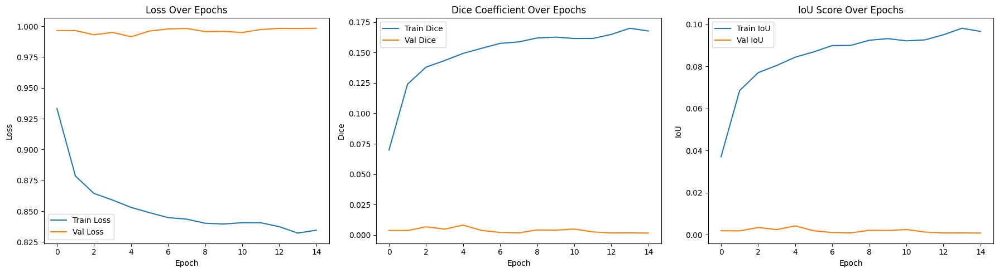

22166

In [ ]:
# ===phase8: # === Freeze encoder + deeper nested decoders ===

import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# === Freeze encoder + deeper nested decoders ===
freeze_list = ['conv00', 'conv10', 'conv20', 'conv30', 'conv40',
               'conv01', 'conv11', 'conv21', 'conv31',
               'conv02', 'conv12', 'conv22',
               'conv03', 'conv13']

for layer in model.layers:
    if any(name in layer.name for name in freeze_list):
        layer.trainable = False
    else:
        layer.trainable = True

print(" Frozen:", ', '.join(freeze_list))




print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_deeper_nested_decoder.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
 All decoder and encoder layers frozen
 All other layers set to trainable


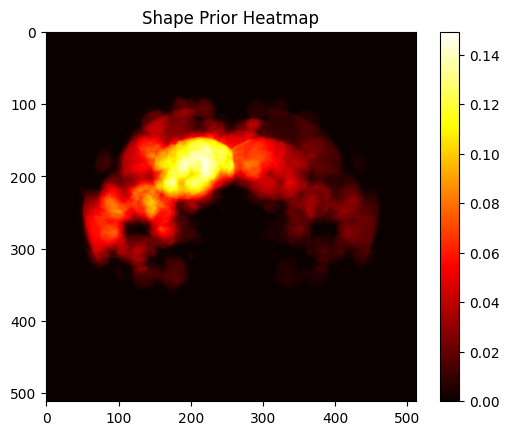

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 11:06:50.501628: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 51s 106ms/step - loss: 0.9354 - dice_coef: 0.0677 - iou_score: 0.0360 - val_loss: 0.9980 - val_dice_coef: 0.0022 - val_iou_score: 0.0011
Epoch 2/50
454/454 [==============================] - 48s 105ms/step - loss: 0.8860 - dice_coef: 0.1162 - iou_score: 0.0637 - val_loss: 0.9985 - val_dice_coef: 0.0016 - val_iou_score: 8.2130e-04
Epoch 3/50
454/454 [==============================] - 48s 105ms/step - loss: 0.8674 - dice_coef: 0.1346 - iou_score: 0.0750 - val_loss: 0.9989 - val_dice_coef: 0.0011 - val_iou_score: 5.5609e-04
Epoch 4/50
454/454 [==============================] - 48s 105ms/step - loss: 0.8588 - dice_coef: 0.1432 - iou_score: 0.0808 - val_loss: 0.9988 - val_dice_coef: 0.0012 - val_iou_score: 6.1001e-04
Epoch 5/50
454/454 [==============================] - 48s 105ms/step - loss: 0.8548 - dice_coef: 0.1472 - iou_score: 0.0829 - val_loss: 0.9989 - val_dice_coef: 0.0012 - val_iou_score: 5.8065e-04
Epoch 6/50
454/454 [====================

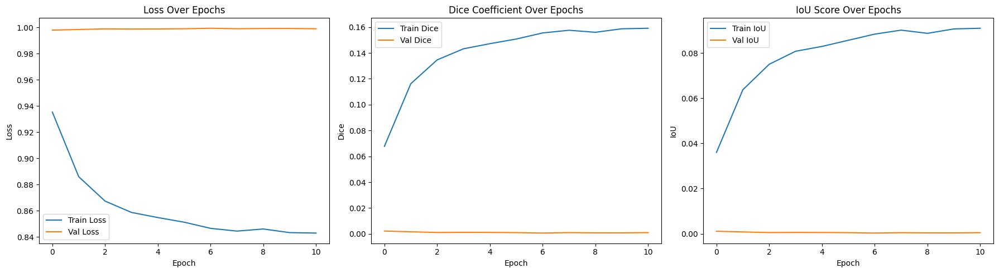

21630

In [ ]:
# #phase9 === Freeze encoder + full nested decoder + output head ===
import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# === Freeze encoder + full nested decoder + output head ===
freeze_list = ['conv00', 'conv10', 'conv20', 'conv30', 'conv40',
               'conv01', 'conv11', 'conv21', 'conv31',
               'conv02', 'conv12', 'conv22',
               'conv03', 'conv13',
               'conv04']

for layer in model.layers:
    if any(name in layer.name for name in freeze_list):
        layer.trainable = False
    else:
        layer.trainable = True

print(" All decoder and encoder layers frozen")




print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_Freeze encoder_plus_deeper_nested_decoder.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
 All other layers set to trainable


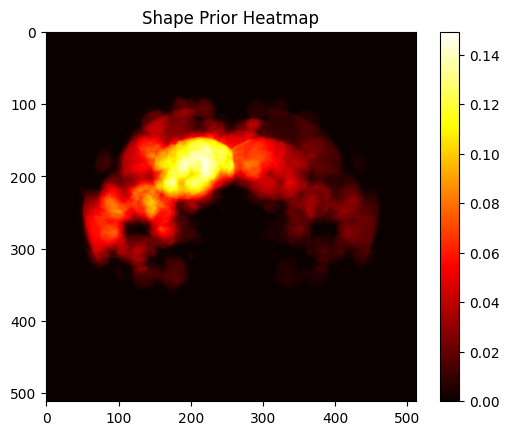

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50
454/454 [==============================] - 75s 146ms/step - loss: 0.8299 - dice_coef: 0.1722 - iou_score: 0.1006 - val_loss: 0.9817 - val_dice_coef: 0.0175 - val_iou_score: 0.0096
Epoch 2/50
454/454 [==============================] - 66s 146ms/step - loss: 0.7625 - dice_coef: 0.2391 - iou_score: 0.1464 - val_loss: 0.8587 - val_dice_coef: 0.1452 - val_iou_score: 0.0813
Epoch 3/50
454/454 [==============================] - 66s 146ms/step - loss: 0.6494 - dice_coef: 0.3515 - iou_score: 0.2316 - val_loss: 0.9197 - val_dice_coef: 0.0943 - val_iou_score: 0.0503
Epoch 4/50
454/454 [==============================] - 66s 146ms/step - loss: 0.5706 - dice_coef: 0.4301 - iou_score: 0.2971 - val_loss: 0.9263 - val_dice_coef: 0.0890 - val_iou_score: 0.0474
Epoch 5/50
454/454 [==============================] - 66s 146ms/step - loss: 0.5063 - dice_coef: 0.4944 - iou_score: 0.3572 - val_loss: 0.9512 - val_dice_coef: 0.0697 -

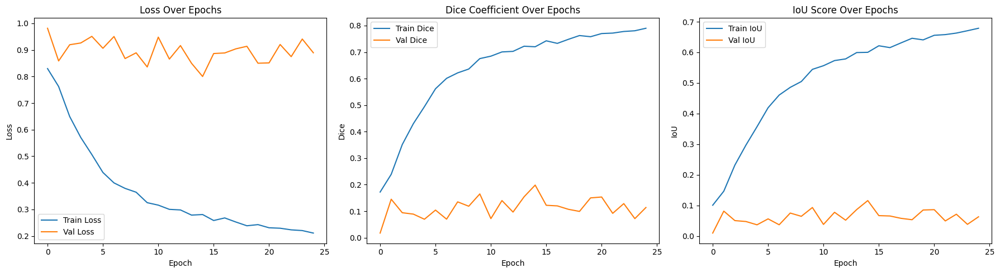

21903

In [ ]:
# #phase10 === unfreeze all layers ===
import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

for layer in model.layers:
    layer.trainable = True





print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_unfreeze_all_layers.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
Freezing layer: conv00_1
Freezing layer: conv00_2
Freezing layer: conv10_1
Freezing layer: conv10_2
Freezing layer: conv01_1
Freezing layer: conv01_2
 All other layers set to trainable


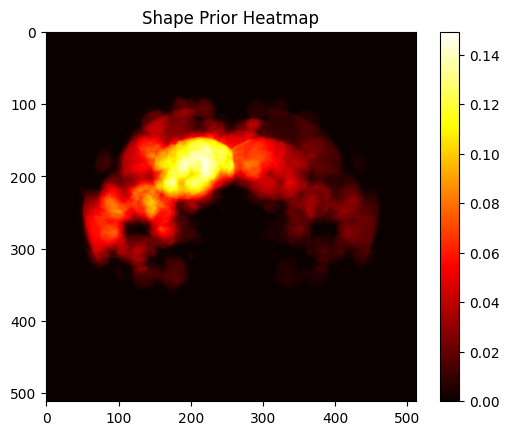

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 16:04:08.747228: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 67s 131ms/step - loss: 0.8515 - dice_coef: 0.1509 - iou_score: 0.0860 - val_loss: 0.9987 - val_dice_coef: 0.0013 - val_iou_score: 6.3184e-04
Epoch 2/50
454/454 [==============================] - 59s 131ms/step - loss: 0.7928 - dice_coef: 0.2084 - iou_score: 0.1279 - val_loss: 0.9930 - val_dice_coef: 0.0071 - val_iou_score: 0.0036
Epoch 3/50
454/454 [==============================] - 60s 132ms/step - loss: 0.7688 - dice_coef: 0.2319 - iou_score: 0.1467 - val_loss: 0.9989 - val_dice_coef: 0.0012 - val_iou_score: 6.0671e-04
Epoch 4/50
454/454 [==============================] - 60s 132ms/step - loss: 0.7501 - dice_coef: 0.2506 - iou_score: 0.1627 - val_loss: 0.9920 - val_dice_coef: 0.0084 - val_iou_score: 0.0043
Epoch 5/50
454/454 [==============================] - 60s 132ms/step - loss: 0.7198 - dice_coef: 0.2809 - iou_score: 0.1848 - val_loss: 0.9965 - val_dice_coef: 0.0038 - val_iou_score: 0.0019
Epoch 6/50
454/454 [============================

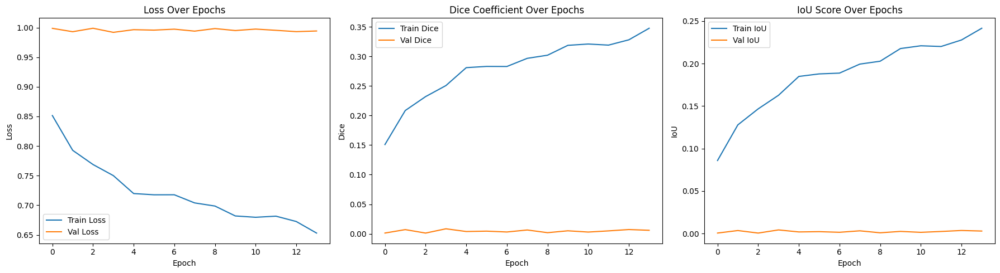

22528

In [ ]:
#initial Dense encoder path
# #phase10 === unfreeze all layers ===
import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# Freeze initial dense encoder path layers
for layer in model.layers:
    if any(name in layer.name for name in ['conv00', 'conv10', 'conv01']):
        layer.trainable = False
        print(f"Freezing layer: {layer.name}")
    # others
    for layer in model.layers:
        if layer.trainable is not False:
            layer.trainable = True


print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_initial_dense_layers.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
Freezing layer: conv00_1
Freezing layer: conv00_2
Freezing layer: conv10_1
Freezing layer: conv10_2
Freezing layer: conv20_1
Freezing layer: conv20_2
Freezing layer: conv11_1
Freezing layer: conv01_1
Freezing layer: conv11_2
Freezing layer: conv01_2
Freezing layer: conv02_1
Freezing layer: conv02_2
 All other layers set to trainable


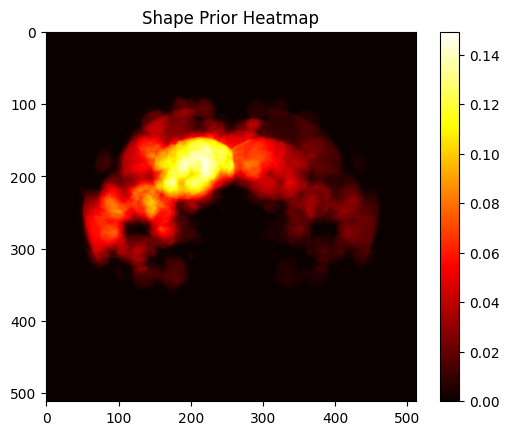

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 16:25:54.155179: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 63s 124ms/step - loss: 0.8570 - dice_coef: 0.1452 - iou_score: 0.0821 - val_loss: 0.9970 - val_dice_coef: 0.0029 - val_iou_score: 0.0015
Epoch 2/50
454/454 [==============================] - 56s 124ms/step - loss: 0.8061 - dice_coef: 0.1952 - iou_score: 0.1177 - val_loss: 0.9884 - val_dice_coef: 0.0111 - val_iou_score: 0.0058
Epoch 3/50
454/454 [==============================] - 56s 124ms/step - loss: 0.7729 - dice_coef: 0.2280 - iou_score: 0.1427 - val_loss: 0.9926 - val_dice_coef: 0.0071 - val_iou_score: 0.0037
Epoch 4/50
454/454 [==============================] - 57s 125ms/step - loss: 0.7553 - dice_coef: 0.2455 - iou_score: 0.1570 - val_loss: 0.9885 - val_dice_coef: 0.0113 - val_iou_score: 0.0059
Epoch 5/50
454/454 [==============================] - 56s 124ms/step - loss: 0.7471 - dice_coef: 0.2537 - iou_score: 0.1629 - val_loss: 0.9974 - val_dice_coef: 0.0030 - val_iou_score: 0.0015
Epoch 6/50
454/454 [==============================] - 56

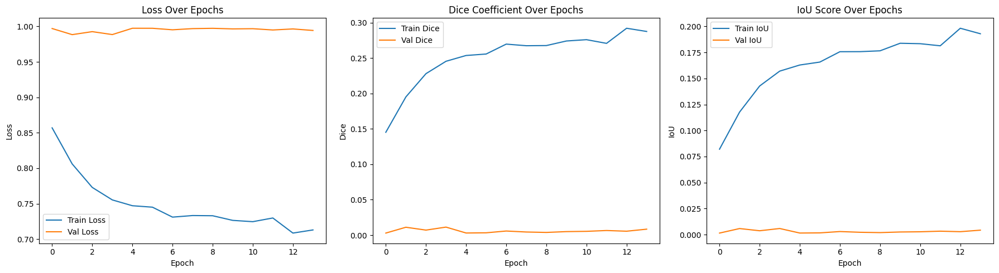

22292

In [ ]:
#initial_second Dense encoder path

import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# Freeze selected encoder and early decoder layers in UNet++
freeze_targets = ['conv00', 'conv10', 'conv20', 'conv01', 'conv02', 'conv11']

for layer in model.layers:
    if any(name in layer.name for name in freeze_targets):
        layer.trainable = False
        print(f"Freezing layer: {layer.name}")


print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_initial_seccond_dense_layers.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()


 Pretrained weights loaded.
Freezing layer: conv00_1
Freezing layer: conv00_2
Freezing layer: conv10_1
Freezing layer: conv10_2
Freezing layer: conv20_1
Freezing layer: conv20_2
Freezing layer: conv30_1
Freezing layer: conv30_2
Freezing layer: conv21_1
Freezing layer: conv11_1
Freezing layer: conv21_2
Freezing layer: conv01_1
Freezing layer: conv11_2
Freezing layer: conv01_2
Freezing layer: conv12_1
Freezing layer: conv02_1
Freezing layer: conv12_2
Freezing layer: conv02_2
Freezing layer: conv03_1
Freezing layer: conv03_2
 All other layers set to trainable


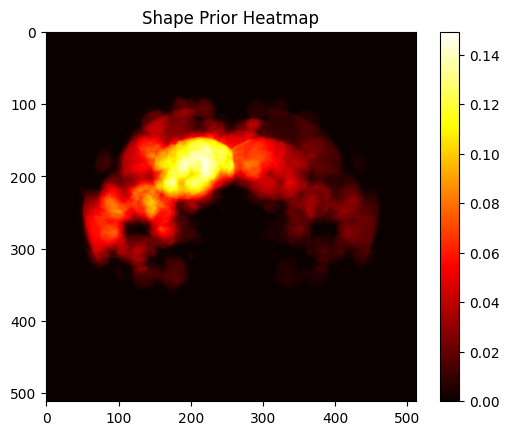

 shape_prior saved to /workspace/shape_prior_models/shape_prior.npy
Epoch 1/50


2025-04-21 16:42:08.409972: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inUNetPP/X00_/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


454/454 [==============================] - 57s 116ms/step - loss: 0.8844 - dice_coef: 0.1180 - iou_score: 0.0657 - val_loss: 0.9908 - val_dice_coef: 0.0088 - val_iou_score: 0.0045
Epoch 2/50
454/454 [==============================] - 52s 115ms/step - loss: 0.8340 - dice_coef: 0.1679 - iou_score: 0.0969 - val_loss: 0.9960 - val_dice_coef: 0.0039 - val_iou_score: 0.0020
Epoch 3/50
454/454 [==============================] - 53s 116ms/step - loss: 0.8161 - dice_coef: 0.1855 - iou_score: 0.1099 - val_loss: 0.9941 - val_dice_coef: 0.0057 - val_iou_score: 0.0029
Epoch 4/50
454/454 [==============================] - 53s 116ms/step - loss: 0.7842 - dice_coef: 0.2168 - iou_score: 0.1340 - val_loss: 0.9975 - val_dice_coef: 0.0025 - val_iou_score: 0.0013
Epoch 5/50
454/454 [==============================] - 53s 116ms/step - loss: 0.7806 - dice_coef: 0.2203 - iou_score: 0.1385 - val_loss: 0.9931 - val_dice_coef: 0.0067 - val_iou_score: 0.0034
Epoch 6/50
454/454 [==============================] - 53

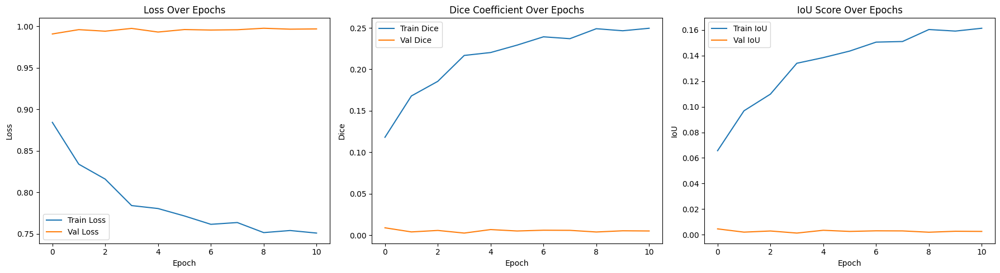

21925

In [ ]:
#initial_second_third Dense encoder path
import os
import importlib.util
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import gc

# === Load UNet++ from given path ===
unetpp_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/UNetPP.py"
spec = importlib.util.spec_from_file_location("UNetPP", unetpp_path)
unetpp_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(unetpp_module)
UNetPlusPlus = unetpp_module.UNetPlusPlus

# === Prepare Data ===
train_img_path = "/workspace/data/final_split_balanced/augmentedtrain/images"
train_mask_path = "/workspace/data/final_split_balanced/augmentedtrain/masks"
valid_img_path = "/workspace/data/final_split_balanced/valid/images"
valid_mask_path = "/workspace/data/final_split_balanced/valid/masks"

train_image_ids = sorted([
    f for f in os.listdir(train_img_path) if f.endswith(".png")
])
valid_image_ids = sorted([
    f for f in os.listdir(valid_img_path) if f.endswith(".png")
])

img_size = 512
batch_size = 4
epochs = 50
lr = 1e-4

train_gen = DICOMDataGen(train_image_ids, train_img_path, train_mask_path, batch_size, img_size, shuffle=True)
valid_gen = DICOMDataGen(valid_image_ids, valid_img_path, valid_mask_path, batch_size, img_size, shuffle=False)

# === Build Model ===
input_shape = (img_size, img_size, 1)
unetpp_instance = UNetPlusPlus(input_shape=input_shape)
model = unetpp_instance.BuildNetwork()

# === Load pretrained weights ===
weights_path = "/workspace/UNet-Plus-Plus---Brain-Tumor-Segmentation/models/UNetpp_BrainTumorSegment.h5"
model.load_weights(weights_path, by_name=True, skip_mismatch=True)
print(" Pretrained weights loaded.")

# Updated list of blocks to freeze
freeze_targets = [
    'conv00', 'conv10', 'conv20', 'conv30',  # encoder path
    'conv01', 'conv02', 'conv03',            # decoder (left columns)
    'conv11', 'conv12', 'conv21'             # mid-decoder layers
]

for layer in model.layers:
    if any(name in layer.name for name in freeze_targets):
        layer.trainable = False
        print(f"Freezing layer: {layer.name}")


print(" All other layers set to trainable")



# === Compute Shape Prior & Visualize ===
shape_prior = compute_shape_prior_from_generator(train_gen)

plt.imshow(shape_prior[..., 0], cmap='hot')
plt.title("Shape Prior Heatmap")
plt.colorbar()
plt.show()
#  Save shape_prior for reuse
np.save("/workspace/shape_prior_models/shape_prior.npy", shape_prior)
print(" shape_prior saved to /workspace/shape_prior_models/shape_prior.npy")



# === Compile model ===
optimizer = tf.keras.optimizers.Adam(learning_rate=lr, clipnorm=0.5)
model.compile(
    optimizer=optimizer,
    loss=total_loss_fn(shape_prior),
    metrics=[dice_coef, iou_score]
)

# === Train model ===
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_dice_coef', mode='max', patience=10, restore_best_weights=True, verbose=1)
]

history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

# === Save model ===
model_path = "/workspace/shape_prior_models/shapeprior_tuned_phase3_initial_seccond_third_dense_layers.h5"
model.save(model_path)
print(f" Model saved to: {model_path}")

# === Plot Training Curves ===
history_dict = history.history
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Val Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history_dict['dice_coef'], label='Train Dice')
plt.plot(history_dict['val_dice_coef'], label='Val Dice')
plt.title('Dice Coefficient Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(history_dict['iou_score'], label='Train IoU')
plt.plot(history_dict['val_iou_score'], label='Val IoU')
plt.title('IoU Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()

plt.tight_layout()
plt.show()

# === Cleanup ===
tf.keras.backend.clear_session()
gc.collect()
